In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from community import community_louvain
import matplotlib.cm as cm

From the files we downloaded, describe Network of American Football games between Division IA colleges during the Fall 2000 regular season with 115 vertices, 613 edges and 12 communities. The vertices and edges represent the colleges and the games between teams, respectively. The communities in this network represent the conferences to which they belong. 

The conferences are:
   Atlantic Coast
   
  Big East
  
  Big Ten
 Big Twelve
 
  Conference USA
  
  Independents
  
  Mid-American
  
  Mountain West
  
  Pacific Ten
  
  Southeastern
  
 Sun Belt
 
 Western Athletic 

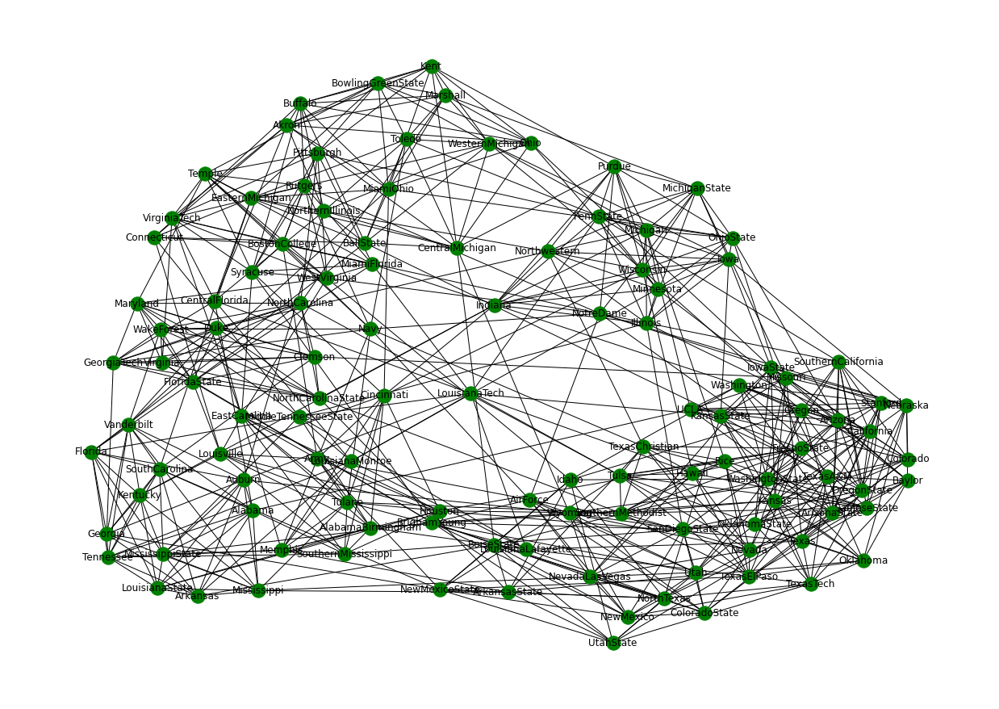

In [21]:
# let build the graph
G = nx.read_gml("football.gml")
# graph visualisation
plt.figure(figsize=(17,12))
nx.draw(G, with_labels=True,node_color="g")

We have one component, connected network, 

We can observed that we have connected graph, mean that every team play at leat one math

# Structure of network and some  network statistics

In [22]:
print(G)

Graph with 115 nodes and 613 edges


We have 115 team's and the total game plays in the year 2000 is 613

In [24]:
# compute number of nodes and edeges in the network
N, L = len(G),len(G.edges)

In [26]:
degree_values = list(dict(G.degree()).values())
average_degree = 2*L/N
average_degree

10.660869565217391

Our average degree is 10.7 is close to eleven mean that majority of team's play 11 game

In [30]:
def var_std(graph):
    degree_values = list(dict(graph.degree()).values())
    # compute the varince
    comp = [(degree-average_degree)**2 for degree in  degree_values]
    var = sum(comp)/len(graph)
    std = var**(1/2)
    return var,std

In [32]:
std, var =var_std(G)
std

0.7806427221172022

In [33]:
print(f"[{average_degree-std},{average_degree+std}]")

[9.88022684310019,11.441512287334593]


The most game must play per team is betwenn 10 and 12.

# Let compute metrics of our network.

In [34]:
# average shortest path length
aspl = nx.average_shortest_path_length(G)
aspl

2.5081617086193746

### eccentricity

In [63]:
def eccentricity(graph):
    eccentricity = list(nx.eccentricity(graph).values())
    values = set(eccentricity)
    values_dict={value:eccentricity.count(value)  for value in values }
    x=list(values_dict.values())
    y=list(map(str,values_dict.keys() ))
    plt.figure(figsize=(5,5))
    plt.pie(x,labels=y,colors=["b", "g"])
    plt.title("pie chart eccentricity of the graph")
    plt.legend(title = "eccentricity: ")

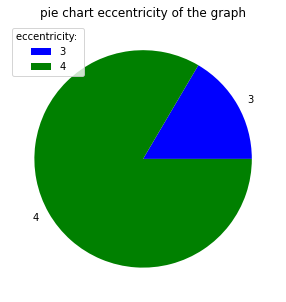

In [64]:
eccentricity(G)

The eccentricity is 3 and 4 mean that the diameter is 4 and the radius is 3.
80% of the teams have diameter 4

### centralities

In [173]:
def centality(graph):
    nodes = list(nx.degree_centrality(graph).keys())
    degree= list(nx.degree_centrality(graph).values())
    closeness = list(nx.closeness_centrality(graph).values())
    eigenvector = list(nx.eigenvector_centrality(graph).values())
    betwenness = list(nx.betweenness_centrality(graph).values())
    plt.figure(figsize=(12,5))
    plt.plot(nodes,degree, label="competion degree centrality")
    plt.plot(nodes,closeness, label="competion closeness centrality")
    plt.plot(nodes,eigenvector, label="competion eigenvector centrality")
    plt.plot(nodes,betwenness, label="competion betweenness_centrality ")
    plt.xlabel("teams")
    plt.grid()
    plt.legend(loc=(0.58,0.4))

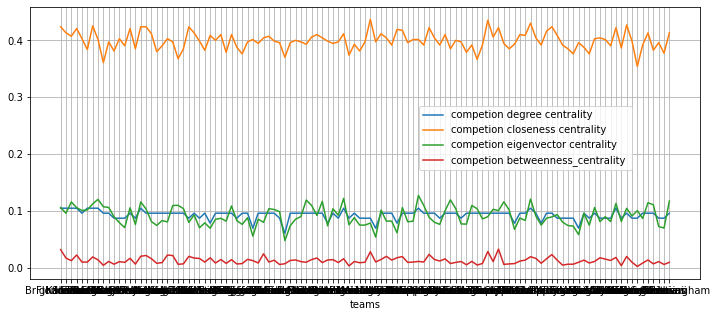

In [174]:
centality(G)

### degree_centrality

In [38]:
x = nx.degree_centrality(G)
# sort dictionnary by values
{k: v for k, v in sorted(x.items(), key=lambda item: item[1],reverse=True)}

{'BrighamYoung': 0.10526315789473684,
 'FloridaState': 0.10526315789473684,
 'Iowa': 0.10526315789473684,
 'KansasState': 0.10526315789473684,
 'TexasTech': 0.10526315789473684,
 'PennState': 0.10526315789473684,
 'SouthernCalifornia': 0.10526315789473684,
 'Wisconsin': 0.10526315789473684,
 'SouthernMethodist': 0.10526315789473684,
 'Nevada': 0.10526315789473684,
 'Tulsa': 0.10526315789473684,
 'NevadaLasVegas': 0.10526315789473684,
 'NewMexico': 0.09649122807017543,
 'ArizonaState': 0.09649122807017543,
 'SanDiegoState': 0.09649122807017543,
 'Northwestern': 0.09649122807017543,
 'Wyoming': 0.09649122807017543,
 'Auburn': 0.09649122807017543,
 'Akron': 0.09649122807017543,
 'VirginiaTech': 0.09649122807017543,
 'Alabama': 0.09649122807017543,
 'UCLA': 0.09649122807017543,
 'Arizona': 0.09649122807017543,
 'Utah': 0.09649122807017543,
 'NorthCarolinaState': 0.09649122807017543,
 'Florida': 0.09649122807017543,
 'BostonCollege': 0.09649122807017543,
 'WestVirginia': 0.09649122807017543

The teams with high  degree centrality are the team which play more game

### betweenness centrality

In [ ]:
x = nx.betweenness_centrality(G)
# sort dictionnary by values
{k: v for k, v in sorted(x.items(), key=lambda item: item[1],reverse=True)}

highest betweness mean that the team play against other team in other conference (1 or more than one conference)

### clustering

In [129]:
x=nx.clustering(G)
# sort dictionnary by values
{k: v for k, v in sorted(x.items(), key=lambda item: item[1],reverse=True)}

{'WakeForest': 0.6666666666666666,
 'Virginia': 0.6444444444444445,
 'Clemson': 0.6222222222222222,
 'Rutgers': 0.6,
 'OregonState': 0.5777777777777777,
 'TexasElPaso': 0.5636363636363636,
 'Rice': 0.5454545454545454,
 'Hawaii': 0.5454545454545454,
 'ColoradoState': 0.5333333333333333,
 'GeorgiaTech': 0.5272727272727272,
 'Duke': 0.5272727272727272,
 'FresnoState': 0.5272727272727272,
 'SanJoseState': 0.5272727272727272,
 'WashingtonState': 0.5272727272727272,
 'Maryland': 0.5272727272727272,
 'AirForce': 0.5111111111111111,
 'Arizona': 0.509090909090909,
 'NorthCarolinaState': 0.509090909090909,
 'NorthCarolina': 0.509090909090909,
 'TexasChristian': 0.509090909090909,
 'BostonCollege': 0.4909090909090909,
 'Kent': 0.4888888888888889,
 'Nevada': 0.48484848484848486,
 'ArizonaState': 0.4727272727272727,
 'SanDiegoState': 0.4727272727272727,
 'WestVirginia': 0.4727272727272727,
 'Washington': 0.4727272727272727,
 'Oregon': 0.4727272727272727,
 'Stanford': 0.4727272727272727,
 'Temple': 

every team don't play against every team because the high clutering is not equal to 1

### closeness centrality

In [40]:
x = nx.closeness_centrality(G)
{k: v for k, v in sorted(x.items(), key=lambda item: item[1],reverse=True)}

{'LouisianaTech': 0.4367816091954023,
 'Navy': 0.4351145038167939,
 'Tulsa': 0.43018867924528303,
 'Indiana': 0.42696629213483145,
 'PennState': 0.4253731343283582,
 'BrighamYoung': 0.42379182156133827,
 'Wisconsin': 0.42379182156133827,
 'Wyoming': 0.42379182156133827,
 'ArkansasState': 0.42379182156133827,
 'Cincinnati': 0.42379182156133827,
 'NewMexicoState': 0.4222222222222222,
 'NotreDame': 0.4222222222222222,
 'NevadaLasVegas': 0.4222222222222222,
 'KansasState': 0.42066420664206644,
 'Northwestern': 0.42066420664206644,
 'MiddleTennesseeState': 0.41911764705882354,
 'Illinois': 0.4175824175824176,
 'Army': 0.41605839416058393,
 'FloridaState': 0.41304347826086957,
 'NorthCarolinaState': 0.41304347826086957,
 'TexasChristian': 0.41304347826086957,
 'Hawaii': 0.41304347826086957,
 'Auburn': 0.41155234657039713,
 'SouthernMethodist': 0.41155234657039713,
 'Minnesota': 0.41155234657039713,
 'WestVirginia': 0.41007194244604317,
 'Michigan': 0.41007194244604317,
 'Houston': 0.41007194

high closeness mean that the team is the team which play more game in this confetrence and against member of other conference 

In [175]:
x=nx.eigenvector_centrality(G)
# sort dictionnary by values
{k: v for k, v in sorted(x.items(), key=lambda item: item[1],reverse=True)}

{'Nevada': 0.1276829966998084,
 'SouthernMethodist': 0.12257661539574176,
 'Tulsa': 0.12128875621075208,
 'SouthernCalifornia': 0.12072375014454013,
 'SanJoseState': 0.11990229488965838,
 'FresnoState': 0.11956811875565126,
 'Hawaii': 0.11769509918671892,
 'Rice': 0.11724599620132099,
 'TexasElPaso': 0.11647136158522087,
 'Wisconsin': 0.11630287637595103,
 'Iowa': 0.11626189945612071,
 'TexasChristian': 0.11494301573636607,
 'NevadaLasVegas': 0.11370347792666848,
 'PennState': 0.11285571635753366,
 'California': 0.11119849038833504,
 'Arizona': 0.11032339044451621,
 'Oregon': 0.11018711699727454,
 'Stanford': 0.11006654691110676,
 'OhioState': 0.11005250319786307,
 'UCLA': 0.10996876923522055,
 'Michigan': 0.1092092904783885,
 'ArizonaState': 0.10781145990002308,
 'SanDiegoState': 0.10653182761728125,
 'BrighamYoung': 0.1065032293978512,
 'MichiganState': 0.10650148529261808,
 'Illinois': 0.10645041383760029,
 'KansasState': 0.10624954486445581,
 'Northwestern': 0.10599493440730601,
 '

In [65]:
nx.wiener_index(G)

16441.0

# Degree distribution

In [92]:
def degree_distribution(graph):
    values,N= list(dict(nx.degree(graph)).values()),len(graph)
    values_set = set(values) 
    values_count_dict = { k:values.count(k)/N for k in values_set }
    plt.bar(values_count_dict.keys(),values_count_dict.values())
    #plt.plot(values_count_dict.keys(),values_count_dict.values())
    plt.xlabel(" degree k", c="g")
    plt.ylabel("probability P(k) ", c="g")
    plt.grid()
    plt.title("degree distribution", c="g")

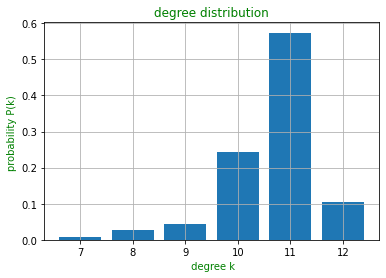

In [93]:
degree_distribution(G)

58% of the team play 11 games

team with less games play 7 match and high play 12 match

90% percent play at least ten games

# Cumulative_distribution

In [61]:
def Cumulative_distribution(graph):
    values,N= list(dict(nx.degree(graph)).values()),len(graph)
    values_set = set(values) 
    som, values_count_dict= 0, {}
    for k in values_set:
        som += values.count(k)
        values_count_dict[k]=som
    plt.figure(figsize=(10,5))    
    plt.plot(values_count_dict.keys(),values_count_dict.values(),ls="--",c="g")
    plt.xlabel("  degree")
    plt.ylabel("cumulative degree")
    plt.title("Cumulative_distribution",c="Magenta")
    plt.grid()

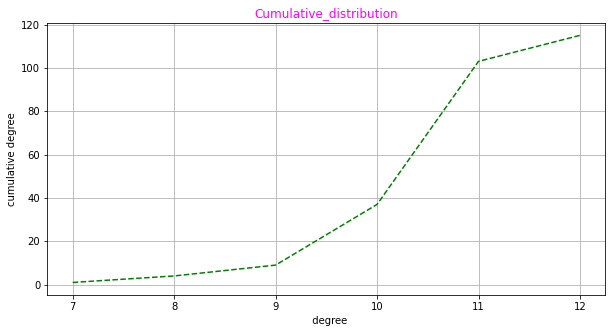

In [62]:
Cumulative_distribution(G)

The we are in a small network N=115<$10^3$,  we follow a binomial  distribution

#  clustering vs degree

Text(0.5, 1.0, ' clustering vs degree')

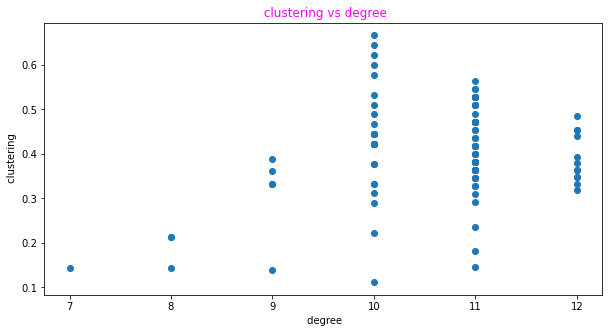

In [66]:
clustering = list(nx.clustering(G).values())
degree = list(dict(nx.degree(G)).values())
plt.figure(figsize=(10,5))  
plt.scatter(degree,clustering)
plt.xlabel(" degree")
plt.ylabel(" clustering")
plt.title(" clustering vs degree",c="Magenta")

Must Team play against opponent most team know each other, for some whitch don't play with many opponent don't know the many of other team's 

## As there is interaction between the different communities this network is able to show the teams that qualify and play the inter-conference competitions, in other words the teams that represent the conferences at the national level

# Detect community 
Here we use louvain alogrithm to detect the communties

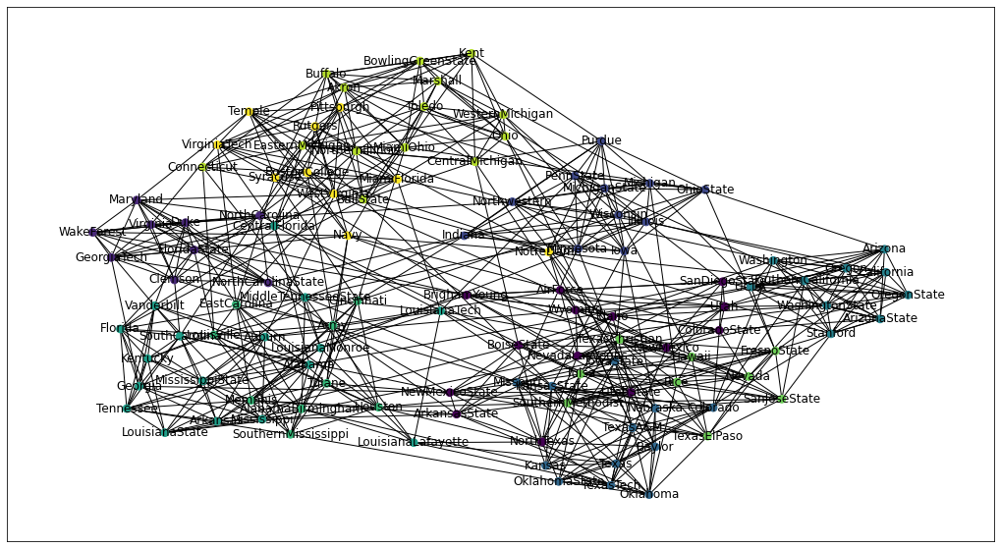

In [41]:
# compute the best partition
partition = community_louvain.best_partition(G)

# draw the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(18, 10))
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=60,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos)
nx.draw_networkx_labels(G,pos)
plt.show()

In [42]:
for i in set(partition.values()):
    print ("community",i)
    members = list_nodes = [nodes for nodes in partition.keys() if partition[nodes]==i]
    print (members)

community 0
['BrighamYoung', 'NewMexico', 'SanDiegoState', 'NorthTexas', 'Wyoming', 'Utah', 'ArkansasState', 'BoiseState', 'ColoradoState', 'Idaho', 'NewMexicoState', 'UtahState', 'AirForce', 'NevadaLasVegas']
community 1
['FloridaState', 'NorthCarolinaState', 'Virginia', 'GeorgiaTech', 'Duke', 'NorthCarolina', 'Clemson', 'WakeForest', 'Maryland']
community 2
['Iowa', 'PennState', 'Northwestern', 'Wisconsin', 'Michigan', 'Purdue', 'OhioState', 'Minnesota', 'Illinois', 'MichiganState', 'Indiana']
community 3
['KansasState', 'TexasTech', 'Baylor', 'Colorado', 'Kansas', 'IowaState', 'Nebraska', 'TexasA&M', 'Oklahoma', 'Texas', 'Missouri', 'OklahomaState']
community 4
['SouthernCalifornia', 'ArizonaState', 'UCLA', 'Arizona', 'Washington', 'Oregon', 'Stanford', 'WashingtonState', 'OregonState', 'California']
community 5
['Auburn', 'Alabama', 'Florida', 'CentralFlorida', 'Kentucky', 'LouisianaTech', 'LouisianaMonroe', 'Vanderbilt', 'MiddleTennesseeState', 'MississippiState', 'SouthCarolina',

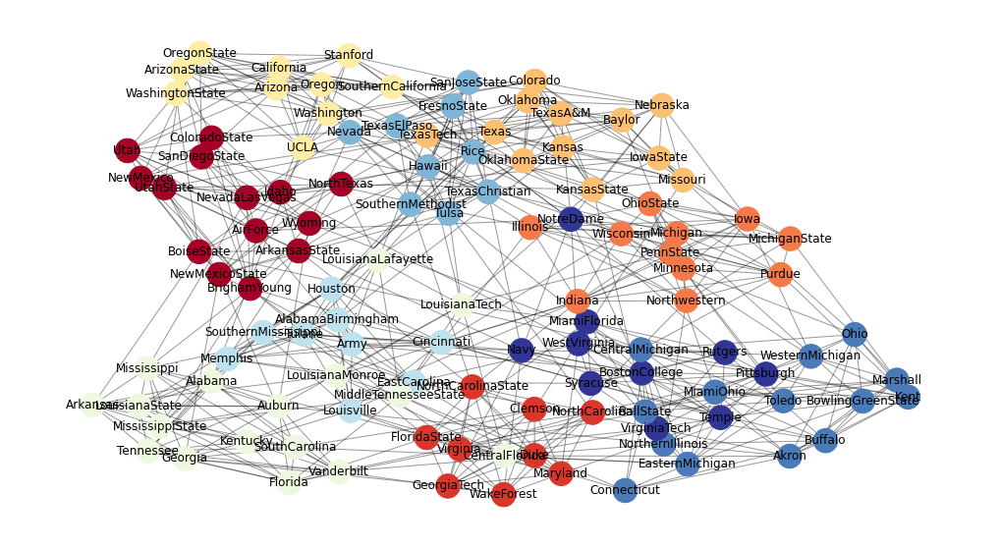

In [43]:
pos = nx.spring_layout(G)  # compute graph layout
plt.figure(figsize=(18, 10))  # image is 8 x 8 inches
plt.axis('off')
nx.draw_networkx_nodes(G, pos, node_size=600, cmap=plt.cm.RdYlBu, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.4)
nx.draw_networkx_labels(G,pos)
plt.show(G)

This Dectection don't reflect the reality because we have 12 community in real case , with louvain we have 9

## Now we want to build the commuty according to the reality

In [44]:
 #this  list of node with label, id and value
# every value is link to one conference
node=[ 
  {
    "id": 0,
    "label": "BrighamYoung",
    "value": 7
  }
  
  ,{
    "id": 1,
    "label": "FloridaState",
    "value": 0
  }
  
  ,{
    "id": 2,
    "label": "Iowa",
    "value": 2
  }
  
  ,{
    "id": 3,
    "label": "KansasState",
    "value": 3
  }
  
  ,{
    "id": 4,
    "label": "NewMexico",
    "value": 7
  }
  
  ,{
    "id": 5,
    "label": "TexasTech",
    "value": 3
  }
  
  ,{
    "id": 6,
    "label": "PennState",
    "value": 2
  }
  
  ,{
    "id": 7,
    "label": "SouthernCalifornia",
    "value": 8
  }
  
  ,{
    "id": 8,
    "label": "ArizonaState",
    "value": 8
  }
  
  ,{
    "id": 9,
    "label": "SanDiegoState",
    "value": 7
  }
  
  ,{
    "id": 10,
    "label": "Baylor",
    "value": 3
  }
  
  ,{
    "id": 11,
    "label": "NorthTexas",
    "value": 10
  }
  
  ,{
    "id": 12,
    "label": "NorthernIllinois",
    "value": 6
  }
  
  ,{
    "id": 13,
    "label": "Northwestern",
    "value": 2
  }
  
  ,{
    "id": 14,
    "label": "WesternMichigan",
    "value": 6
  }
  
  ,{
    "id": 15,
    "label": "Wisconsin",
    "value": 2
  }
  
  ,{
    "id": 16,
    "label": "Wyoming",
    "value": 7
  }
  
  ,{
    "id": 17,
    "label": "Auburn",
    "value": 9
  }
  
  ,{
    "id": 18,
    "label": "Akron",
    "value": 6
  }
  
  ,{
    "id": 19,
    "label": "VirginiaTech",
    "value": 1
  }
  
  ,{
    "id": 20,
    "label": "Alabama",
    "value": 9
  }
  
  ,{
    "id": 21,
    "label": "UCLA",
    "value": 8
  }
  
  ,{
    "id": 22,
    "label": "Arizona",
    "value": 8
  }
  
  ,{
    "id": 23,
    "label": "Utah",
    "value": 7
  }
  
  ,{
    "id": 24,
    "label": "ArkansasState",
    "value": 10
  }
  
  ,{
    "id": 25,
    "label": "NorthCarolinaState",
    "value": 0
  }
  
  ,{
    "id": 26,
    "label": "BallState",
    "value": 6
  }
  
  ,{
    "id": 27,
    "label": "Florida",
    "value": 9
  }
  
  ,{
    "id": 28,
    "label": "BoiseState",
    "value": 11
  }
  
  ,{
    "id": 29,
    "label": "BostonCollege",
    "value": 1
  }
  
  ,{
    "id": 30,
    "label": "WestVirginia",
    "value": 1
  }
  
  ,{
    "id": 31,
    "label": "BowlingGreenState",
    "value": 6
  }
  
  ,{
    "id": 32,
    "label": "Michigan",
    "value": 2
  }
  
  ,{
    "id": 33,
    "label": "Virginia",
    "value": 0
  }
  
  ,{
    "id": 34,
    "label": "Buffalo",
    "value": 6
  }
  
  ,{
    "id": 35,
    "label": "Syracuse",
    "value": 1
  }
  
  ,{
    "id": 36,
    "label": "CentralFlorida",
    "value": 5
  }
  
  ,{
    "id": 37,
    "label": "GeorgiaTech",
    "value": 0
  }
  
  ,{
    "id": 38,
    "label": "CentralMichigan",
    "value": 6
  }
  
  ,{
    "id": 39,
    "label": "Purdue",
    "value": 2
  }
  
  ,{
    "id": 40,
    "label": "Colorado",
    "value": 3
  }
  
  ,{
    "id": 41,
    "label": "ColoradoState",
    "value": 7
  }
  
  ,{
    "id": 42,
    "label": "Connecticut",
    "value": 5
  }
  
  ,{
    "id": 43,
    "label": "EasternMichigan",
    "value": 6
  }
  
  ,{
    "id": 44,
    "label": "EastCarolina",
    "value": 4
  }
  
  ,{
    "id": 45,
    "label": "Duke",
    "value": 0
  }
  
  ,{
    "id": 46,
    "label": "FresnoState",
    "value": 11
  }
  
  ,{
    "id": 47,
    "label": "OhioState",
    "value": 2
  }
  
  ,{
    "id": 48,
    "label": "Houston",
    "value": 4
  }
  
  ,{
    "id": 49,
    "label": "Rice",
    "value": 11
  }
  
  ,{
    "id": 50,
    "label": "Idaho",
    "value": 10
  }
  
  ,{
    "id": 51,
    "label": "Washington",
    "value": 8
  }
  
  ,{
    "id": 52,
    "label": "Kansas",
    "value": 3
  }
  
  ,{
    "id": 53,
    "label": "SouthernMethodist",
    "value": 11
  }
  
  ,{
    "id": 54,
    "label": "Kent",
    "value": 6
  }
  
  ,{
    "id": 55,
    "label": "Pittsburgh",
    "value": 1
  }
  
  ,{
    "id": 56,
    "label": "Kentucky",
    "value": 9
  }
  
  ,{
    "id": 57,
    "label": "Louisville",
    "value": 4
  }
  
  ,{
    "id": 58,
    "label": "LouisianaTech",
    "value": 11
  }
  
  ,{
    "id": 59,
    "label": "LouisianaMonroe",
    "value": 10
  }
  
  ,{
    "id": 60,
    "label": "Minnesota",
    "value": 2
  }
  
  ,{
    "id": 61,
    "label": "MiamiOhio",
    "value": 6
  }
  
  ,{
    "id": 62,
    "label": "Vanderbilt",
    "value": 9
  }
  
  ,{
    "id": 63,
    "label": "MiddleTennesseeState",
    "value": 10
  }
  
  ,{
    "id": 64,
    "label": "Illinois",
    "value": 2
  }
  
  ,{
    "id": 65,
    "label": "MississippiState",
    "value": 9
  }
  
  ,{
    "id": 66,
    "label": "Memphis",
    "value": 4
  }
  
  ,{
    "id": 67,
    "label": "Nevada",
    "value": 11
  }
  
  ,{
    "id": 68,
    "label": "Oregon",
    "value": 8
  }
  
  ,{
    "id": 69,
    "label": "NewMexicoState",
    "value": 10
  }
  
  ,{
    "id": 70,
    "label": "SouthCarolina",
    "value": 9
  }
  
  ,{
    "id": 71,
    "label": "Ohio",
    "value": 6
  }
  
  ,{
    "id": 72,
    "label": "IowaState",
    "value": 3
  }
  
  ,{
    "id": 73,
    "label": "SanJoseState",
    "value": 11
  }
  
  ,{
    "id": 74,
    "label": "Nebraska",
    "value": 3
  }
  
  ,{
    "id": 75,
    "label": "SouthernMississippi",
    "value": 4
  }
  
  ,{
    "id": 76,
    "label": "Tennessee",
    "value": 9
  }
  
  ,{
    "id": 77,
    "label": "Stanford",
    "value": 8
  }
  
  ,{
    "id": 78,
    "label": "WashingtonState",
    "value": 8
  }
  
  ,{
    "id": 79,
    "label": "Temple",
    "value": 1
  }
  
  ,{
    "id": 80,
    "label": "Navy",
    "value": 5
  }
  
  ,{
    "id": 81,
    "label": "TexasA&M",
    "value": 3
  }
  
  ,{
    "id": 82,
    "label": "NotreDame",
    "value": 5
  }
  
  ,{
    "id": 83,
    "label": "TexasElPaso",
    "value": 11
  }
  
  ,{
    "id": 84,
    "label": "Oklahoma",
    "value": 3
  }
  
  ,{
    "id": 85,
    "label": "Toledo",
    "value": 6
  }
  
  ,{
    "id": 86,
    "label": "Tulane",
    "value": 4
  }
  
  ,{
    "id": 87,
    "label": "Mississippi",
    "value": 9
  }
  
  ,{
    "id": 88,
    "label": "Tulsa",
    "value": 11
  }
  
  ,{
    "id": 89,
    "label": "NorthCarolina",
    "value": 0
  }
  
  ,{
    "id": 90,
    "label": "UtahState",
    "value": 5
  }
  
  ,{
    "id": 91,
    "label": "Army",
    "value": 4
  }
  
  ,{
    "id": 92,
    "label": "Cincinnati",
    "value": 4
  }
  
  ,{
    "id": 93,
    "label": "AirForce",
    "value": 7
  }
  
  ,{
    "id": 94,
    "label": "Rutgers",
    "value": 1
  }
  
  ,{
    "id": 95,
    "label": "Georgia",
    "value": 9
  }
  
  ,{
    "id": 96,
    "label": "LouisianaState",
    "value": 9
  }
  
  ,{
    "id": 97,
    "label": "LouisianaLafayette",
    "value": 10
  }
  
  ,{
    "id": 98,
    "label": "Texas",
    "value": 3
  }
  
  ,{
    "id": 99,
    "label": "Marshall",
    "value": 6
  }
  
  ,{
    "id": 100,
    "label": "MichiganState",
    "value": 2
  }
  
  ,{
    "id": 101,
    "label": "MiamiFlorida",
    "value": 1
  }
  
  ,{
    "id": 102,
    "label": "Missouri",
    "value": 3
  }
  
  ,{
    "id": 103,
    "label": "Clemson",
    "value": 0
  }
  
  ,{
    "id": 104,
    "label": "NevadaLasVegas",
    "value": 7
  }
  
  ,{
    "id": 105,
    "label": "WakeForest",
    "value": 0
  }
  
  ,{
    "id": 106,
    "label": "Indiana",
    "value": 2
  }
  
  ,{
    "id": 107,
    "label": "OklahomaState",
    "value": 3
  }
  
  ,{
    "id": 108,
    "label": "OregonState",
    "value": 8
  }
  
  ,{
    "id": 109,
    "label": "Maryland",
    "value": 0
  }
  
  ,{
    "id": 110,
    "label": "TexasChristian",
    "value": 4
  }
  
  ,{
    "id": 111,
    "label": "California",
    "value": 8
  }
  
  ,{
    "id": 112,
    "label": "AlabamaBirmingham",
    "value": 4
  }
  
  ,{
    "id": 113,
    "label": "Arkansas",
    "value": 9
  }
  
  ,{
    "id": 114,
    "label": "Hawaii",
    "value": 11
  }
]

In [47]:
# conference with his value
affect = {0 : "Atlantic Coast",
  1 :"Big East",
  2: "Big Ten",
  3: "Big Twelve",
  4 : "Conference USA",
  5 : "Independents",
  6 : "Mid-American",
  7 : "Mountain West",
  8 : "Pacific Ten",
  9 : "Southeastern",
 10 : "Sun Belt",
 11 : "Western Athletic"}

In [48]:
# add confere to the attribute of node
for i in node:
    i["conference"]=affect[i["value"]]

In [49]:
node

[{'id': 0, 'label': 'BrighamYoung', 'value': 7, 'conference': 'Mountain West'},
 {'id': 1,
  'label': 'FloridaState',
  'value': 0,
  'conference': 'Atlantic Coast'},
 {'id': 2, 'label': 'Iowa', 'value': 2, 'conference': 'Big Ten'},
 {'id': 3, 'label': 'KansasState', 'value': 3, 'conference': 'Big Twelve'},
 {'id': 4, 'label': 'NewMexico', 'value': 7, 'conference': 'Mountain West'},
 {'id': 5, 'label': 'TexasTech', 'value': 3, 'conference': 'Big Twelve'},
 {'id': 6, 'label': 'PennState', 'value': 2, 'conference': 'Big Ten'},
 {'id': 7,
  'label': 'SouthernCalifornia',
  'value': 8,
  'conference': 'Pacific Ten'},
 {'id': 8, 'label': 'ArizonaState', 'value': 8, 'conference': 'Pacific Ten'},
 {'id': 9,
  'label': 'SanDiegoState',
  'value': 7,
  'conference': 'Mountain West'},
 {'id': 10, 'label': 'Baylor', 'value': 3, 'conference': 'Big Twelve'},
 {'id': 11, 'label': 'NorthTexas', 'value': 10, 'conference': 'Sun Belt'},
 {'id': 12,
  'label': 'NorthernIllinois',
  'value': 6,
  'confere

In [50]:
# create empty dictionnary to match every conference with is team's
conf={"Atlantic Coast":[], "Big East":[],
  "Big Ten":[],
  "Big Twelve":[],
  "Conference USA":[],
  "Independents":[],
  "Mid-American":[],
  "Mountain West":[],
  "Pacific Ten":[],
  "Southeastern":[],
 "Sun Belt":[],
 "Western Athletic":[]}

In [51]:
for i in node:
    conf[i["conference"]].append(i['label'])

In [52]:
conf

{'Atlantic Coast': ['FloridaState',
  'NorthCarolinaState',
  'Virginia',
  'GeorgiaTech',
  'Duke',
  'NorthCarolina',
  'Clemson',
  'WakeForest',
  'Maryland'],
 'Big East': ['VirginiaTech',
  'BostonCollege',
  'WestVirginia',
  'Syracuse',
  'Pittsburgh',
  'Temple',
  'Rutgers',
  'MiamiFlorida'],
 'Big Ten': ['Iowa',
  'PennState',
  'Northwestern',
  'Wisconsin',
  'Michigan',
  'Purdue',
  'OhioState',
  'Minnesota',
  'Illinois',
  'MichiganState',
  'Indiana'],
 'Big Twelve': ['KansasState',
  'TexasTech',
  'Baylor',
  'Colorado',
  'Kansas',
  'IowaState',
  'Nebraska',
  'TexasA&M',
  'Oklahoma',
  'Texas',
  'Missouri',
  'OklahomaState'],
 'Conference USA': ['EastCarolina',
  'Houston',
  'Louisville',
  'Memphis',
  'SouthernMississippi',
  'Tulane',
  'Army',
  'Cincinnati',
  'TexasChristian',
  'AlabamaBirmingham'],
 'Independents': ['CentralFlorida',
  'Connecticut',
  'Navy',
  'NotreDame',
  'UtahState'],
 'Mid-American': ['NorthernIllinois',
  'WesternMichigan',

In [58]:
# math every team to his conference id
part={}
for i in conf:
    for j in affect:
        if affect[j]== i:
            for k in conf[i]:
                part[k]=j

In [59]:
part

{'FloridaState': 0,
 'NorthCarolinaState': 0,
 'Virginia': 0,
 'GeorgiaTech': 0,
 'Duke': 0,
 'NorthCarolina': 0,
 'Clemson': 0,
 'WakeForest': 0,
 'Maryland': 0,
 'VirginiaTech': 1,
 'BostonCollege': 1,
 'WestVirginia': 1,
 'Syracuse': 1,
 'Pittsburgh': 1,
 'Temple': 1,
 'Rutgers': 1,
 'MiamiFlorida': 1,
 'Iowa': 2,
 'PennState': 2,
 'Northwestern': 2,
 'Wisconsin': 2,
 'Michigan': 2,
 'Purdue': 2,
 'OhioState': 2,
 'Minnesota': 2,
 'Illinois': 2,
 'MichiganState': 2,
 'Indiana': 2,
 'KansasState': 3,
 'TexasTech': 3,
 'Baylor': 3,
 'Colorado': 3,
 'Kansas': 3,
 'IowaState': 3,
 'Nebraska': 3,
 'TexasA&M': 3,
 'Oklahoma': 3,
 'Texas': 3,
 'Missouri': 3,
 'OklahomaState': 3,
 'EastCarolina': 4,
 'Houston': 4,
 'Louisville': 4,
 'Memphis': 4,
 'SouthernMississippi': 4,
 'Tulane': 4,
 'Army': 4,
 'Cincinnati': 4,
 'TexasChristian': 4,
 'AlabamaBirmingham': 4,
 'CentralFlorida': 5,
 'Connecticut': 5,
 'Navy': 5,
 'NotreDame': 5,
 'UtahState': 5,
 'NorthernIllinois': 6,
 'WesternMichigan':

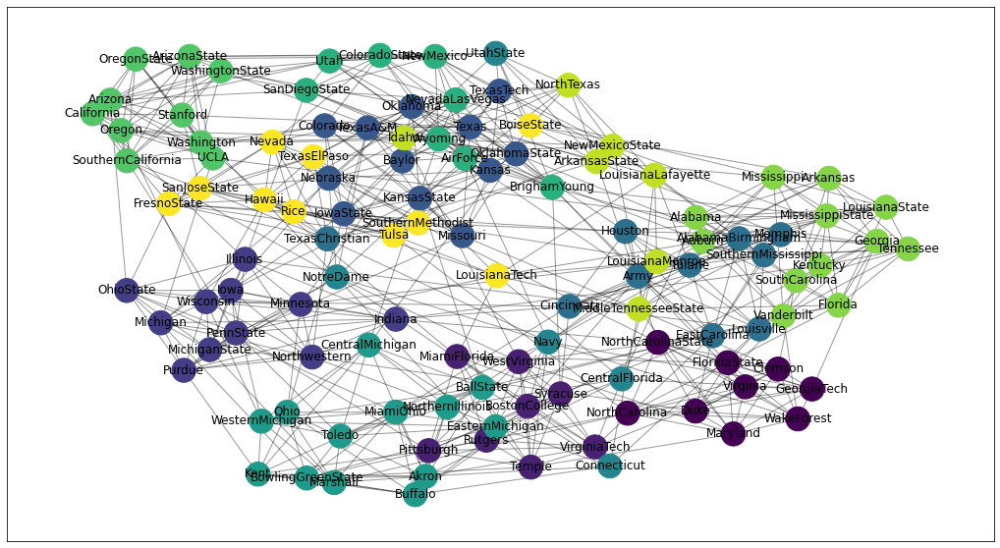

In [60]:
# draw the community the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(18, 10))
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(part.values()) + 1)
nx.draw_networkx_nodes(G, pos, part.keys(), node_size=600,
                       cmap=cmap, node_color=list(part.values()))
nx.draw_networkx_edges(G, pos,alpha=0.4)
nx.draw_networkx_labels(G,pos)
plt.show()

# Let know study a community one by one

In [67]:
for sub in conf:
    # extract subgraph
    subG=G.subgraph(conf[sub])
    print("conference: ",sub,"\n", nx.clustering(subG))
    print("betweness: ",sub,"\n", nx.betweenness_centrality(subG))

conference:  Atlantic Coast 
 {'FloridaState': 1.0, 'NorthCarolina': 1.0, 'Clemson': 1.0, 'WakeForest': 1.0, 'GeorgiaTech': 1.0, 'Virginia': 1.0, 'NorthCarolinaState': 1.0, 'Duke': 1.0, 'Maryland': 1.0}
betweness:  Atlantic Coast 
 {'FloridaState': 0.0, 'NorthCarolina': 0.0, 'Clemson': 0.0, 'WakeForest': 0.0, 'GeorgiaTech': 0.0, 'Virginia': 0.0, 'NorthCarolinaState': 0.0, 'Duke': 0.0, 'Maryland': 0.0}
conference:  Big East 
 {'Temple': 1.0, 'MiamiFlorida': 1.0, 'Rutgers': 1.0, 'Syracuse': 1.0, 'VirginiaTech': 1.0, 'Pittsburgh': 1.0, 'BostonCollege': 1.0, 'WestVirginia': 1.0}
betweness:  Big East 
 {'Temple': 0.0, 'MiamiFlorida': 0.0, 'Rutgers': 0.0, 'Syracuse': 0.0, 'VirginiaTech': 0.0, 'Pittsburgh': 0.0, 'BostonCollege': 0.0, 'WestVirginia': 0.0}
conference:  Big Ten 
 {'PennState': 0.75, 'Northwestern': 0.75, 'Illinois': 0.75, 'MichiganState': 0.75, 'OhioState': 0.75, 'Wisconsin': 0.75, 'Michigan': 0.75, 'Purdue': 0.75, 'Minnesota': 0.75, 'Indiana': 0.75, 'Iowa': 0.75}
betweness:  Bi

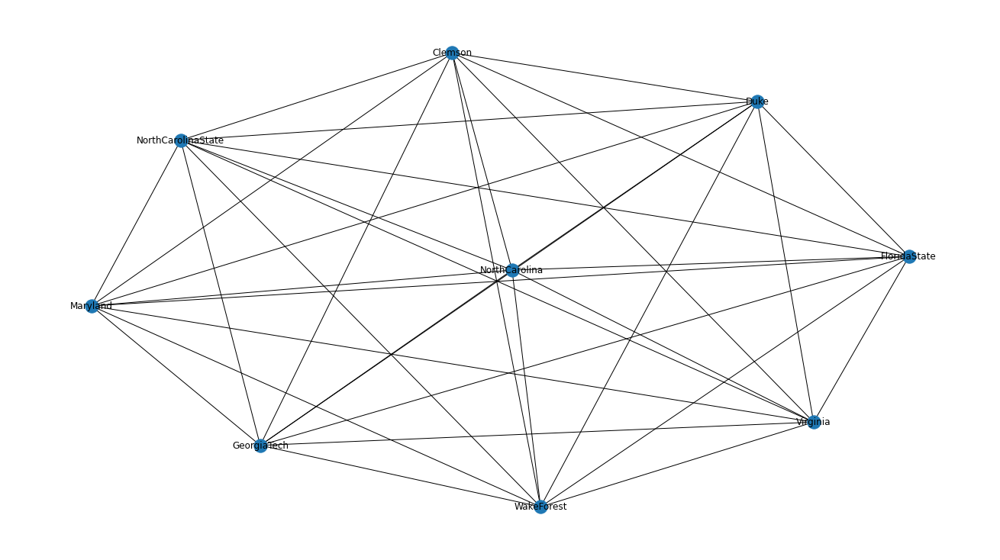

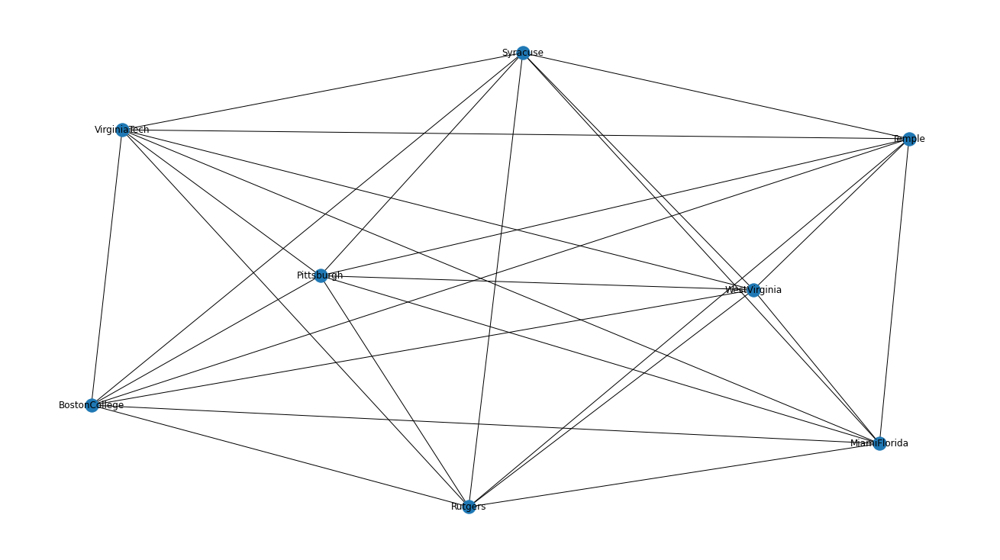

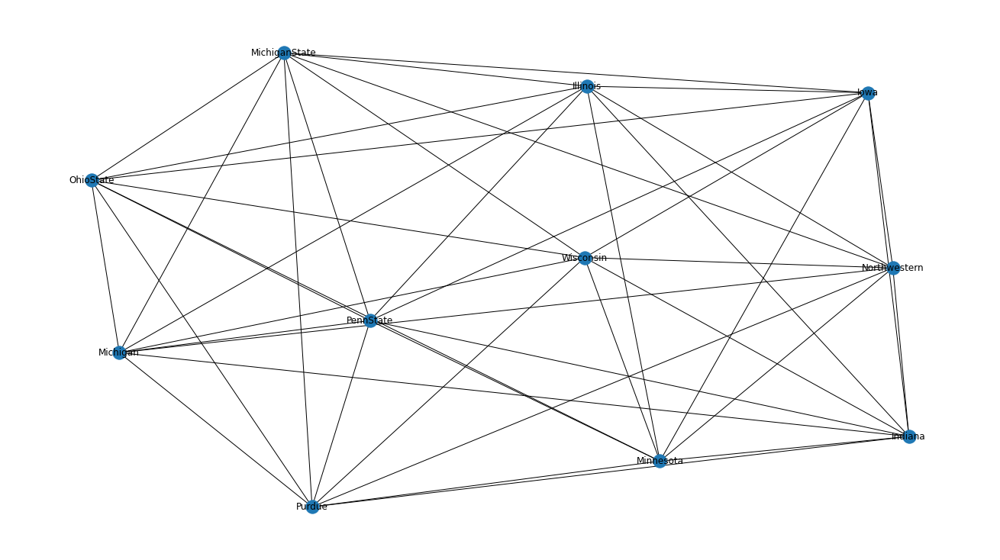

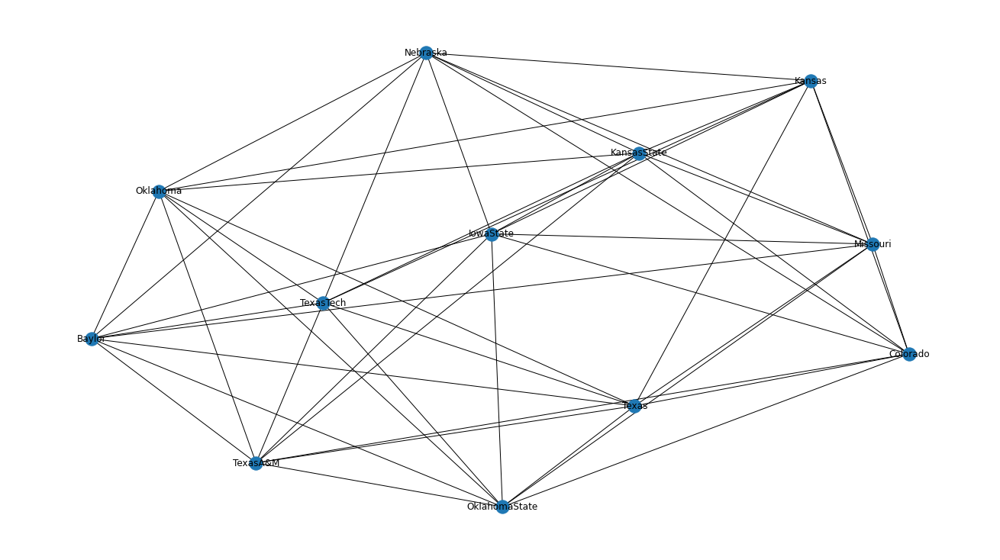

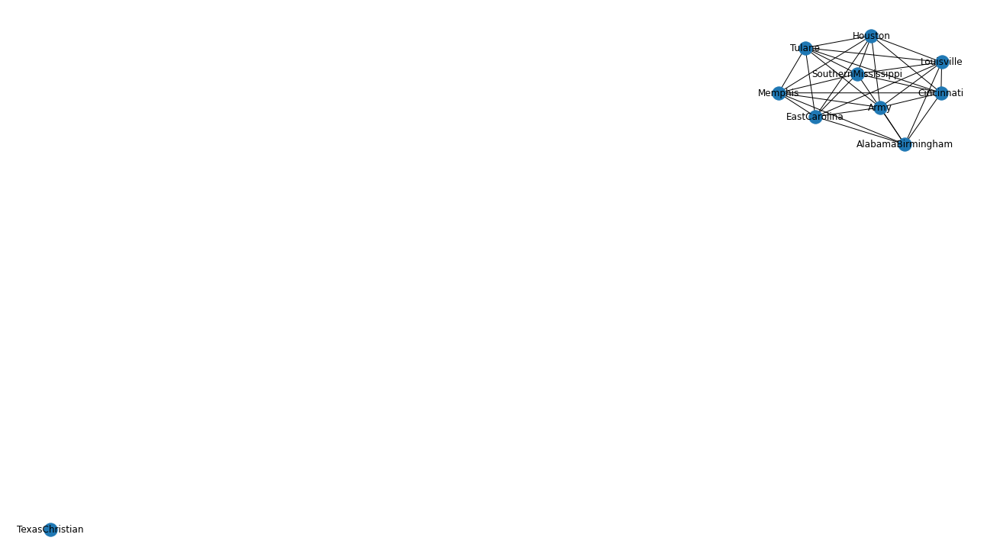

...

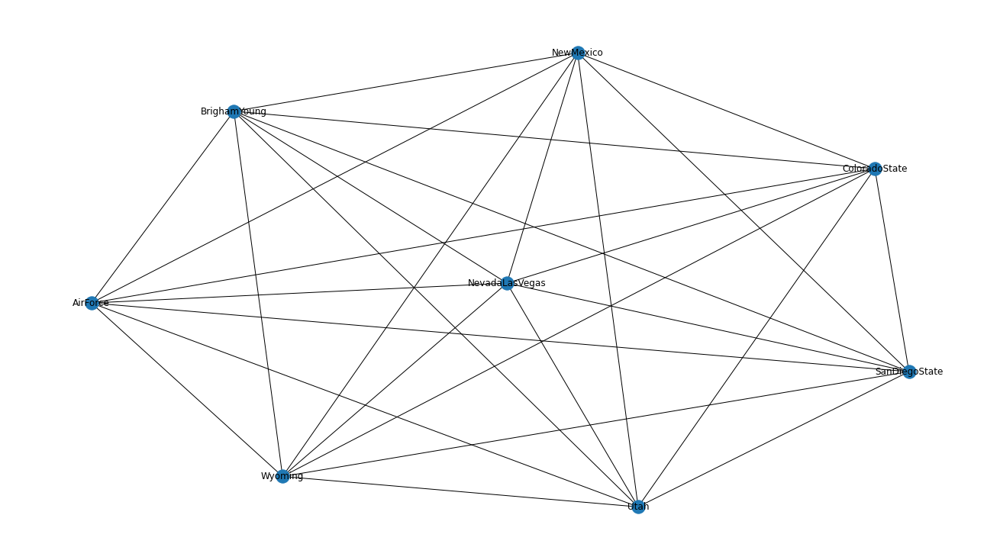

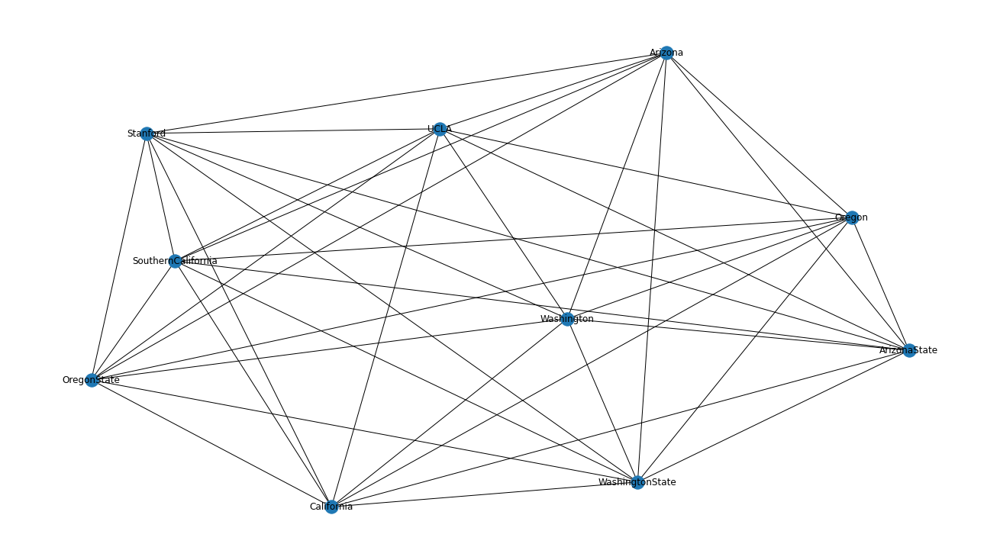

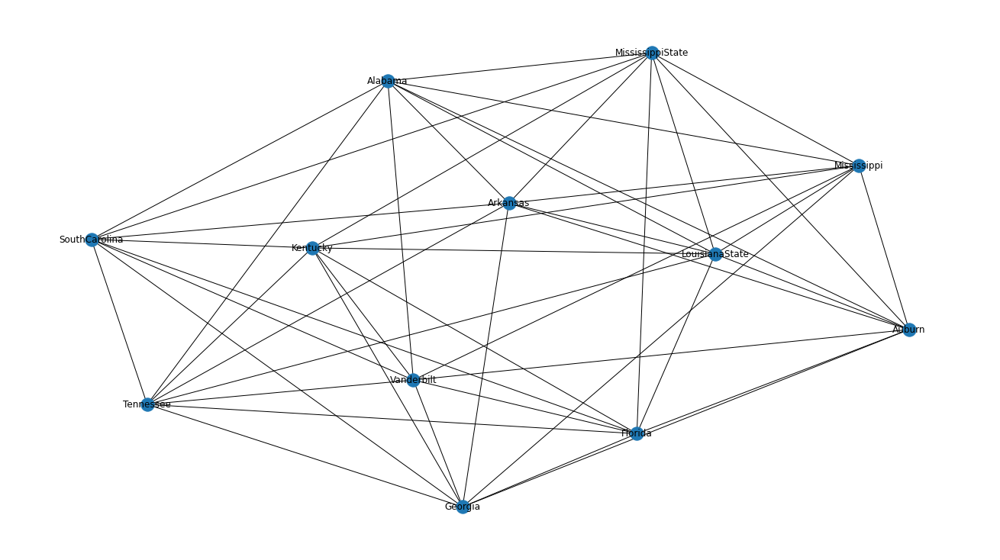

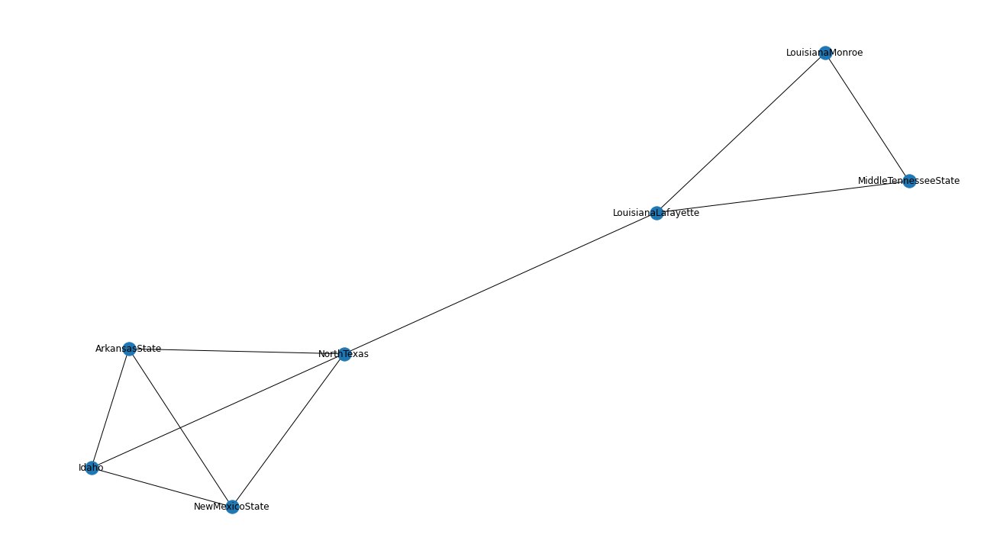

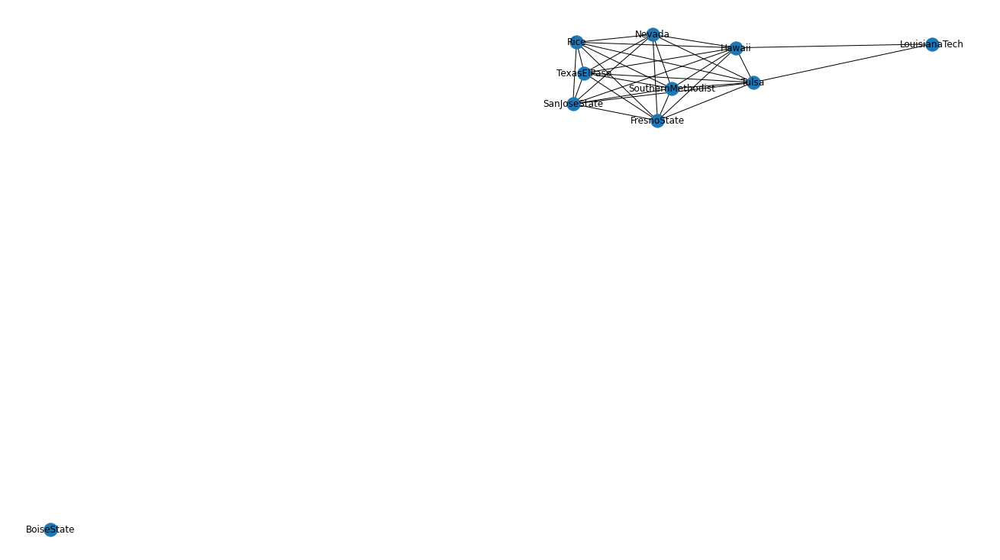

In [65]:
for sub in conf:
    subG=G.subgraph(conf[sub])
    plt.figure(figsize=(18, 10))
    nx.draw(subG, with_labels=True)

When we inspect we remaque that the are somme team who don't play with teams of there community

clusturing=1
In most of community everybody play with all of other menber in the community is mean that the season is finish in this community.

for some community clusturing less than 1 is mean that their championship not coming to end

# Let now study the relation between community

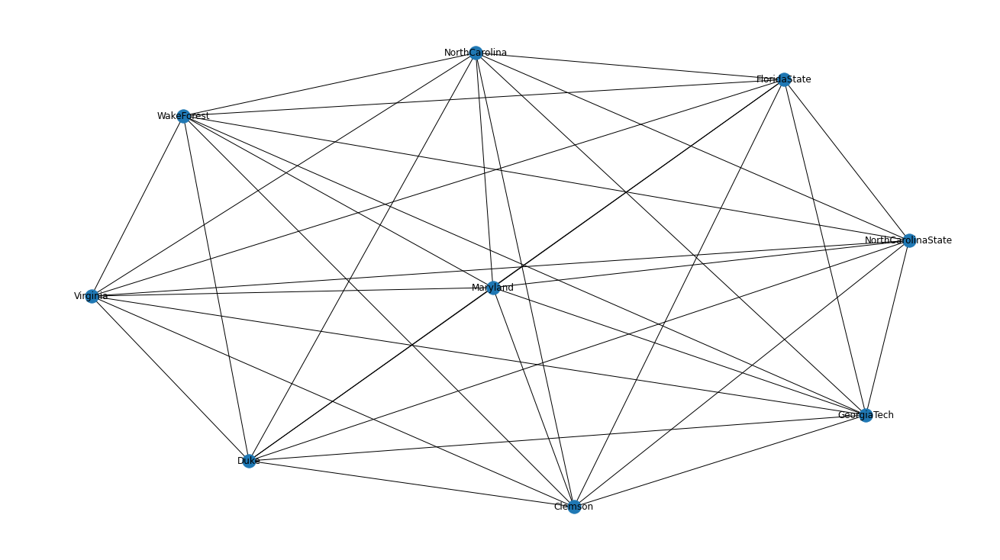

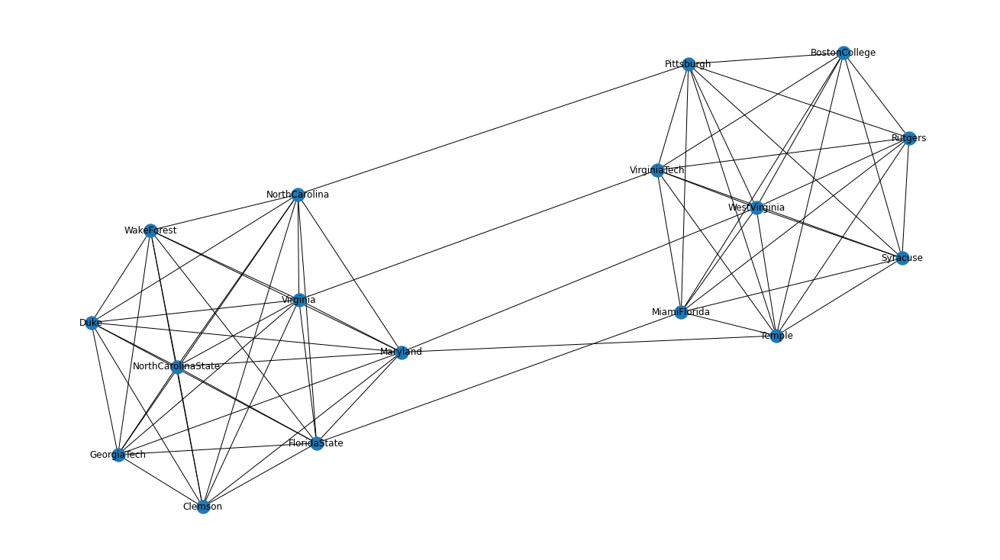

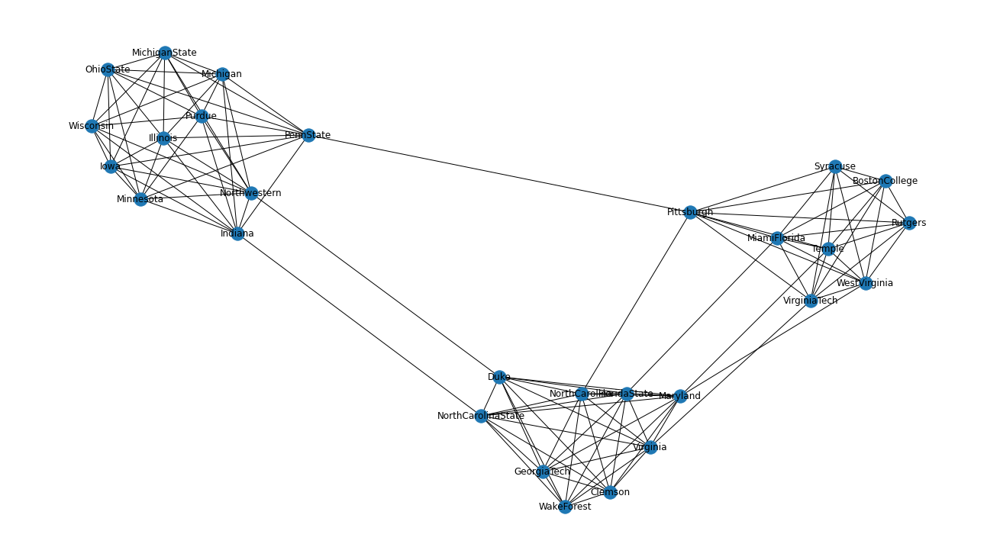

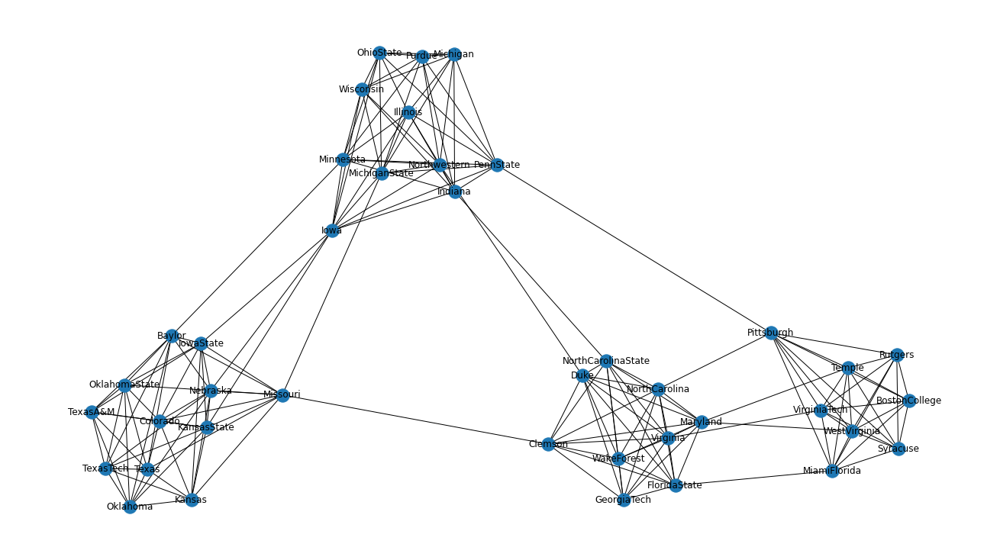

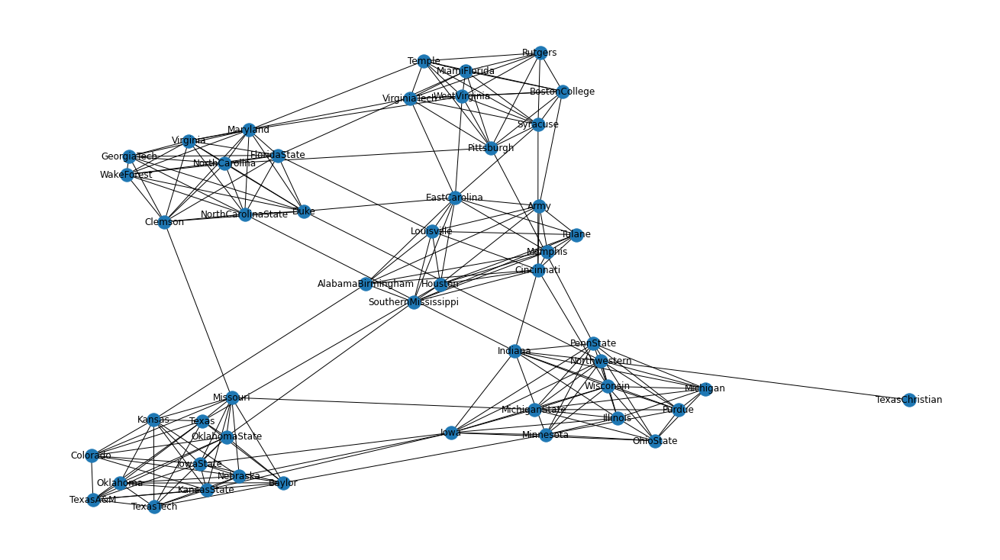

...

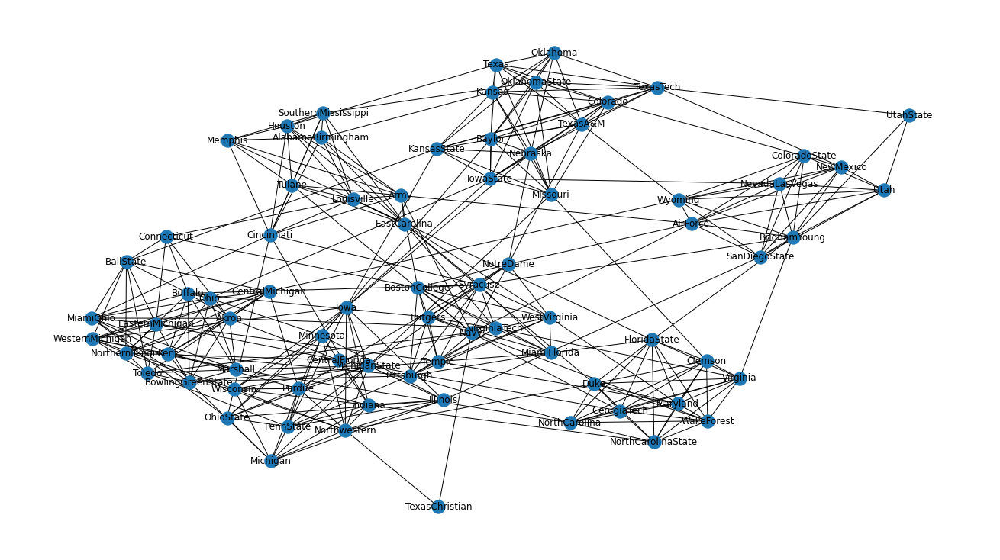

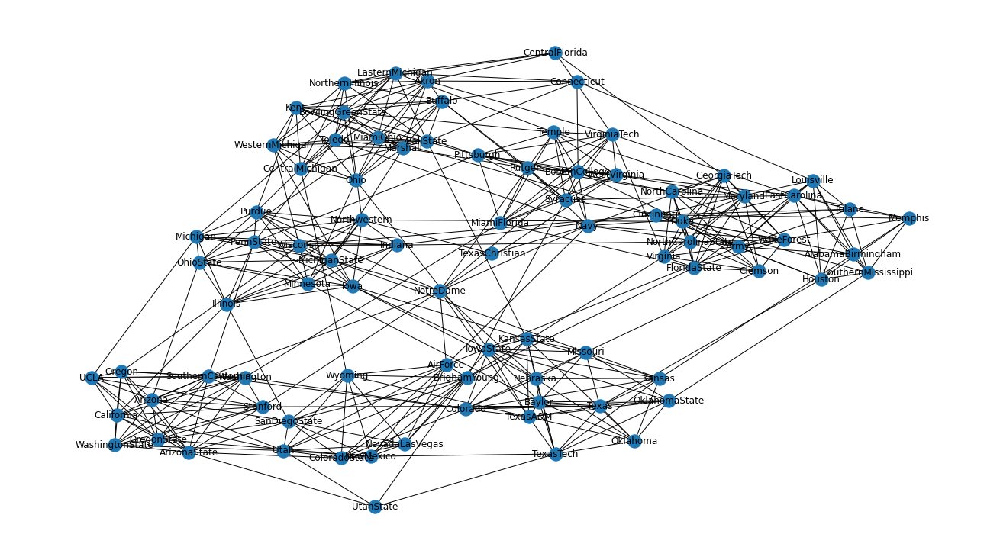

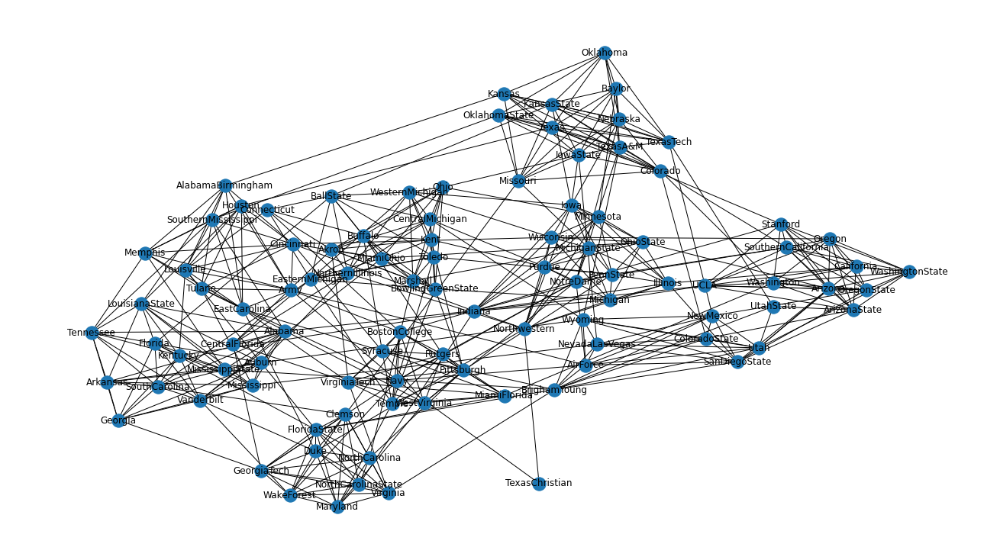

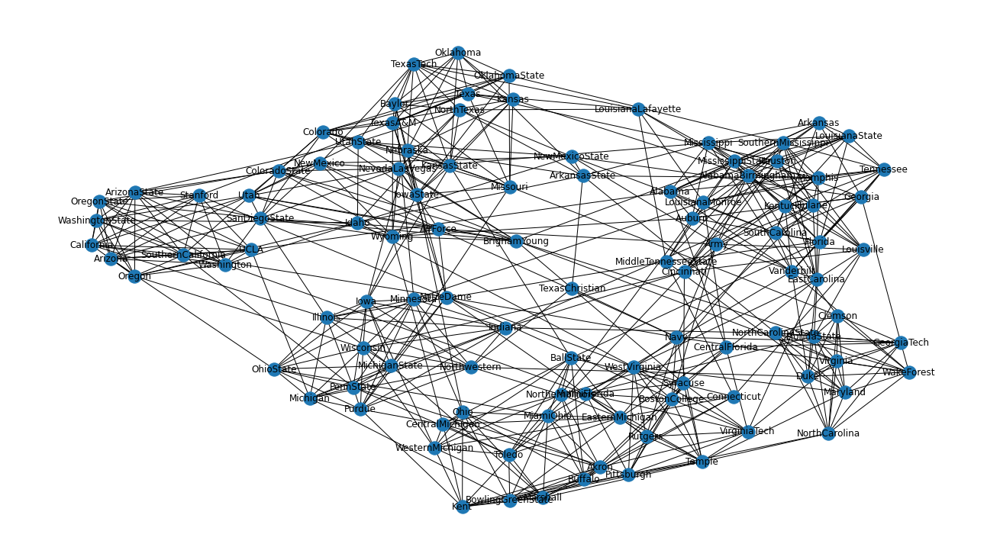

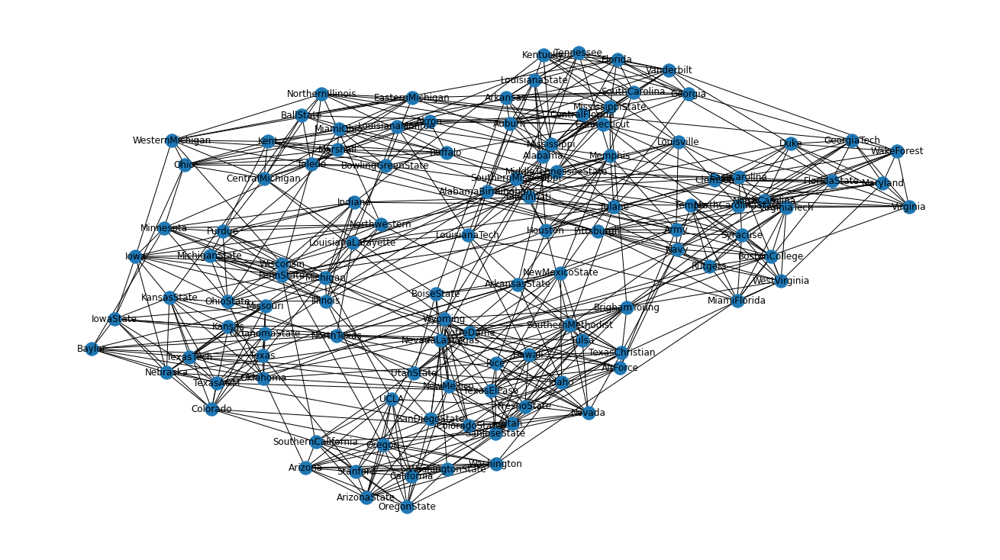

In [80]:
# compution the relation between subgraph succevely
allo = []
for sub in conf:
    # determine the subgraph
    allo+=conf[sub]
    subG=G.subgraph(allo)
    plt.figure(figsize=(18, 10))
    nx.draw(subG, with_labels=True)



### The social network influence the final grade

We can see that at the of the season the teams who represent the conference where be the team with will be more coted.

The team who have more match with other conferences teams is succeptible to win the inter-conference league

# Let find which  teams  who play more game with team of other conference, if all  play against

In [91]:
x = nx.betweenness_centrality(G)
# sort dictionnary by values
y={k: v for k, v in sorted(x.items(), key=lambda item: item[1],reverse=True)}

In [164]:
# select the two fu
s=list(y.keys())[:12]


In [165]:
subG=G.subgraph(s)

In [166]:
list(subG)
test={}
for i in subG:
    test[i]= part[i]

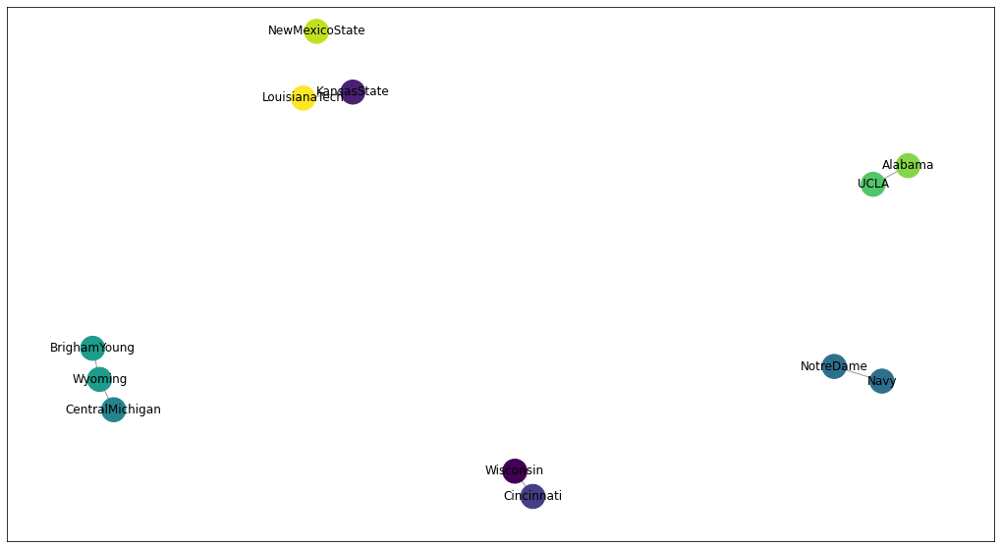

In [167]:

pos = nx.spring_layout(subG)
plt.figure(figsize=(18, 10))
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(test.values()) + 1)
nx.draw_networkx_nodes(subG, pos, test.keys(), node_size=600,
                       cmap=cmap, node_color=list(test.values()))
nx.draw_networkx_edges(subG, pos,alpha=0.4)
nx.draw_networkx_labels(subG,pos)
plt.show()

In [172]:
# define set of value
setn= set(list(test.values()))

In [169]:
comu = []
for i in setn:
    comu.append(affect[i])
    

In [171]:
print(comu,len(comu))

['Big Ten', 'Big Twelve', 'Conference USA', 'Independents', 'Mid-American', 'Mountain West', 'Pacific Ten', 'Southeastern', 'Sun Belt', 'Western Athletic'] 10


the twelveth first teams who have high betweeness not all play against. we can deduce that eith is just match between different conference or the inter-conference championship is not over.